# Identify parameters for thresholding-based segmentation

## Contents and Introduction
This notebook is to help identify the parameters needed to successfully analyze images for roots, hyphae, and other stringy things in medicore images. It walks through the functions in the order presented in ``pyroots.pyroots_analysis`` and gives tips for how to set parameters. At the end, you can use it to write``analysis_parameters.py``. The parameters given should work well for light roots scanned against a blue background at a moderate-high resolution (here, 300 DPI). 


Parameters to change are show within blocks of hashtags, like:
```
################################################################
change_this_parameter = to_this
################################################################
```

You shouldn't need to change much else. Don't forget to save a copy of this notebook in it's original state!!

### Contents
1. Prepare the image and workspace:
    1. Load the image
    2. Identify slices for closer viewing
2. Segmentation
    1. Identify colorspace and select bands
    2. Set threshold parameters
3. Filter objects
    1. Exclude regions if necessary by applying a mask
    2. Smooth and remove small objects/holes
    3. Remove objects based on shape
4. Measure objects
    1. Skeletonize
    2. Measure length and diameter
5. Filter again
    1. Length:width ratios
    2. Diameter
6. Summarize
    1. All objects
    2. By diameter class

## Load the image
### Load and set notebook options

**Options**
- Input directory
- Input file (as a list, to cycle through easily)
- Selection index (from that list). Remember zero indexing in python.
- Plot flag. Plots of images take a  long time to make, and so can be useful to skip. This affects all steps up to testing the full function.
- Anayze flag. Similar to the plot flag. If you just want to change a parameter and re-generate the settings script, set this to False.
- Zoom dim. For making n * n pixel slices of the image, for easier viewing. <700 pixels is recommended.

Optional:
- Custom zoom coordinates. 
- Custom zoom names

Image Dimensions [length, width, bands]: [5453, 4282, 3]


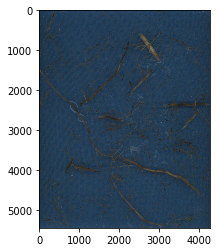

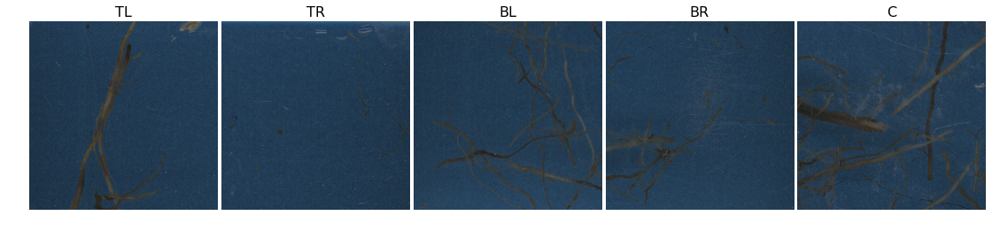

In [3]:
%matplotlib inline

#########################################################################################
dir_in = "/home/patrick/Cloud/Codes/pyroots/Example Images/Roots - Color"
file_in = ["Root_Color_1.TIF", "Root_Color_2.TIF", "Root_Color_1.TIF"]

# what image do you want to test? Select the image index from the file_in list.
selection = 0

plot_control = True  # do you want to view images as you generate them (useful for setting parameters)
# plot_control = False  # useful for debugging

analyze = True
# analyze = False

# Zoom to these coordinates

zoom_dim = 700 # pixels
#########################################################################################

from matplotlib import pyplot as plt
from skimage import io, color, filters, draw, morphology, exposure, img_as_ubyte, restoration
import pyroots as pr
import numpy as np
from scipy import ndimage
import os

image = io.imread(os.path.join(dir_in, file_in[selection]))

xmax = image.shape[1]
xmin = xmax - zoom_dim
ymax = image.shape[0]
ymin = ymax - zoom_dim

zoom_list = [{'xmin' : 0, 'xmax' : zoom_dim, 'ymin' : 0, 'ymax' : zoom_dim}, 
             {'xmin' : xmin, 'xmax' : xmax, 'ymin' : 0, 'ymax' : zoom_dim},
             {'xmin' : 0, 'xmax' : zoom_dim, 'ymin' : ymin, 'ymax' : ymax},
             {'xmin' : xmin, 'xmax' : xmax, 'ymin' : ymin, 'ymax' : ymax},
             {'xmin' : int(xmin/2), 'xmax' : int((xmax + zoom_dim)/2), 'ymin' : int(ymin/2), 'ymax' : int((ymax + zoom_dim)/2)}
            ]
zoom_names = ['Top Left',
              'Top Right',
              'Bottom Left',
              'Bottom Right',
              'Center'] # length and order should match len(zoom_list)

print("Image Dimensions [length, width, bands]: " + str([i for i in image.shape]))

if plot_control is True:
    img = image
    plt.imshow(img)

    pr.multi_image_plot([pr._zoom(img, **i) for i in zoom_list], ['TL', 'TR', 'BL', 'BR', 'C'])

# Identify Colorspace, threshold

## Choose a colorspace (color images)
What colorspace do you want to use? Options include LAB, HSV, and CMY in addition to RGB. 

Choose the one that allows the objects you want to keep "pop", while objects you don't want to keep don't pop. Zoom in to an area of the image that is well lit with good contrast, probably near the center of the image. Contrast will be adjusted later on. 

Once decided, note whether the interesting objects appear dark on a light background, or light on a dark background. 

**If your objects are stained, pay special attention that the stain takes a different value than things like residue bits!**

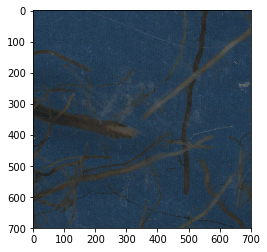

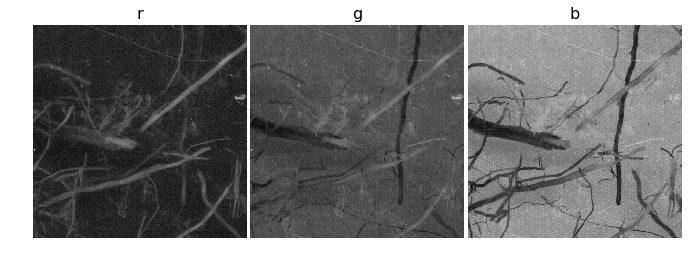

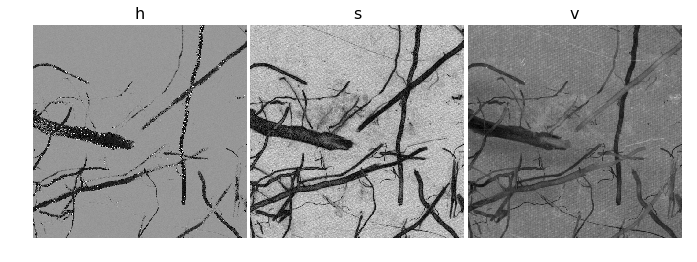

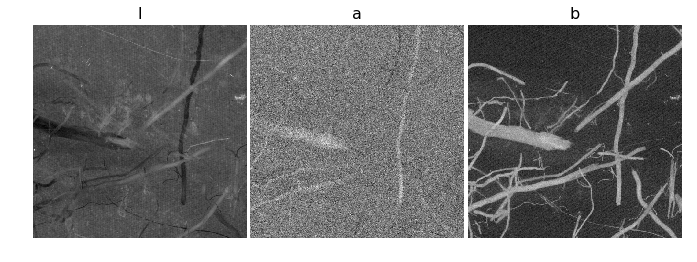

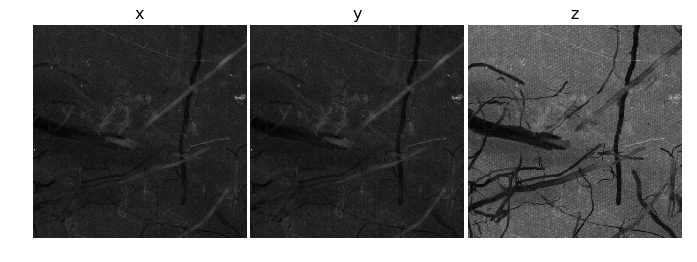

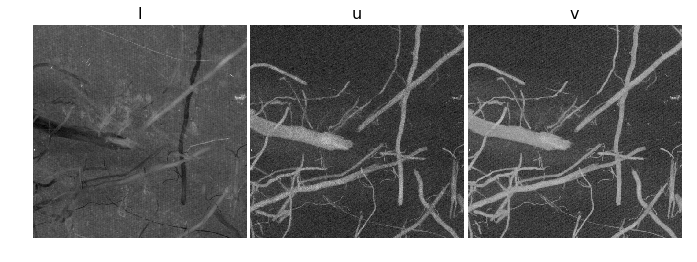

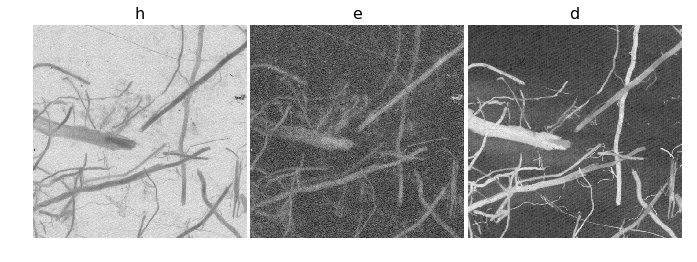

In [12]:
####################################################
colorspaces = ['rgb','hsv','lab','xyz','luv', 'hed']  # add or remove whatever you're curious about. See skimage.color documentation.
zoom_to = zoom_list[4]
####################################################

if plot_control is True:
    img = image
    plt.imshow(pr._zoom(img, **zoom_to))
    [pr.band_viewer(image, i, zoom_coords = zoom_to) for i in colorspaces]

Here, the "r" band of RGB looks great:
- Roots are both clear and sharp (unlike 'g')
- Dirt, dead roots, and residue are less distinguishable than live roots in this band, which makes it easier to remove them later.
- Note that objects are light objects on a dark background. 

The 'b' band will also be helpful:
- roots are clear and sharp
- scratches and vapor on the root tray are light, the opposite of true objects
- Note whether objects are dark objects on a light background (True), or light on a dark background (False)

## Flag the bands (all images)

For color images, choose the colorspace, band, and whether the roots are dark objects on a light background (for each band within colorspace). `'band'` and `'dark_on_light'` should be lists of the same length.

For black and white images, identify whether the objects are dark (on a light background) or light (on a dark background).

In [8]:
#########################################################################################
# color images

colors = {'colorspace'    : 'rgb',
          'band'          : [0, 2],        # ex. rgb: 0 = red, 1 = green, 2 = blue
          'dark_on_light' : [False, True]  # True for dark objects on light background
         }

# black and white images
# colors = 'dark'  # dark objects on a light background. Comment out for color images.
#########################################################################################
if analyze is True:

    # convert band to list for downstream compatibilty, if necessary
    if len(colors) == 3: # it's a color image
        try:
            len(colors['band'])
        except: 
            colors['band'] = [colors['band']]
            pass

        # convert colorspace, if necessary
        if colors['colorspace'].lower() != 'rgb':
            band = getattr(color, "rgb2" + colors['colorspace'])(image)
        else:
            band = image.copy()
        
        # select band
        band = [pr.img_split(band)[i] for i in colors['band']]
        
        nbands = len(colors['band'])
    else:  # it's a black and white image
        if image.shape == 3:
            raise ValueError("Color images require color image parameters. Yours are black and white parameters.")
        band = [image.copy()]
        nbands = 1

if plot_control is True:

    # plot one of the bands
    zoom=zoom_list[4]
    [pr.multi_image_plot([i, pr._zoom(i, **zoom)], ["Image", "Zoomed"]) for i in band]

# band = exposure.rescale_intensity(band[0], out_range = (0, 255))

NameError: name 'zoom' is not defined

## Adaptively enhance contrast
Some parts of the image may have low contrast. This will enhance the contrast locally, and improve thresholding somewhat.

Parameters:
- `contrast_kernel_size`: In pixels. Recommend at at most 1/4 of the minimum image dimension. If `None`, then  `skimage.exposure.equalize_adapthist()` uses 1/8 of the the height by 1/8 of the width (and should give good results). If `skip`, then this skips the process. 

/home/patrick/Programs/scikit-image/skimage/util/dtype.py:122: UserWarning: Possible precision loss when converting from float64 to uint8
  .format(dtypeobj_in, dtypeobj_out))


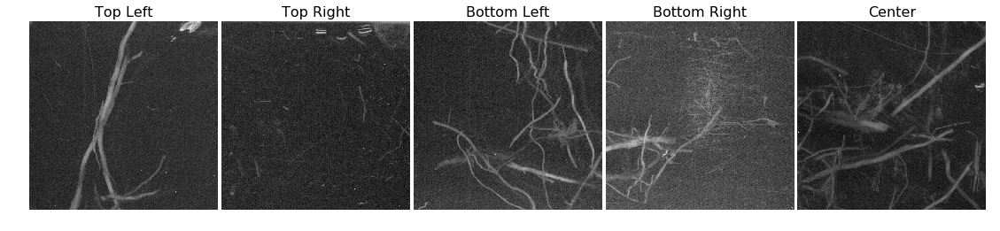

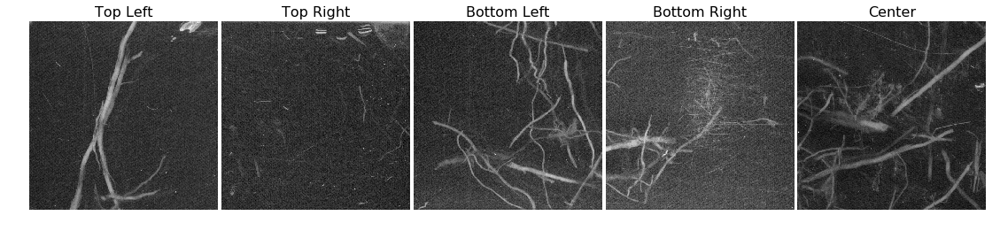

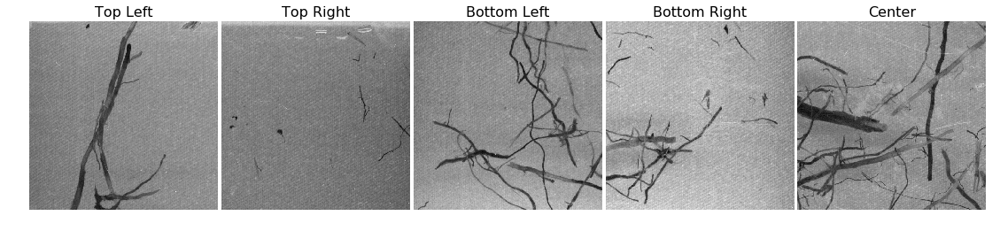

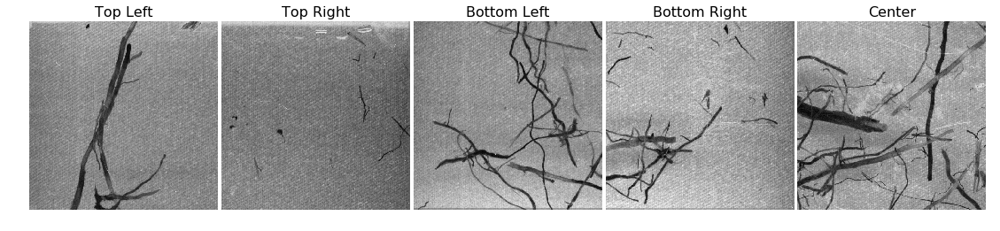

In [13]:
####################################################################
contrast_kernel_size = 500
# contrast_kernel_size = 'skip'
####################################################################
if analyze is True:

    adapt_equal = band.copy()
    for i in range(nbands):
        temp = exposure.equalize_adapthist(band[i], kernel_size = contrast_kernel_size)
        adapt_equal[i] = img_as_ubyte(temp)

if plot_control is True:
    for i in range(len(adapt_equal)):
        img = band[i]
        pr.multi_image_plot([pr._zoom(img, **i) for i in zoom_list], zoom_names)

        img = adapt_equal[i]
        pr.multi_image_plot([pr._zoom(img, **i) for i in zoom_list], zoom_names)

## Set Thresholding Parameters
Next, we need to set thresholding parameters. This uses ``scipy.ndimage.filters.threshold_adaptive`` to separate objects from the background. The function sets a threshold at each pixel based on the local mean, and offset by a constant. 

The parameters to set are:
* ``block_size`` = the size of the neighborhood. Must be odd. Smaller numbers are more sensitive to edges of crossing objects, but also may miss the inside of large objects. Start with ``191``. 
* ``offset`` = additional values above a set threshold. This has a strong effect on filtering. Adjust this. Can be negative (for light objects on dark backgrounds)
* ``param`` = base calculation of the threshold. The function suggests ``(block_size-1)/6``. This has a minor effect on filtering, but larger values slow processing.

Add a `threshold_params` dictionary to the list for each of the bands.

The goal is not to have a perfectly clean image, but rather one where the objects are more or less fully defined and also clear of extraneous objects. We'll remove noise and dirt later.

Finally:

** Objects to keep should be WHITE**

To ensure this, see the band selection step.

Band 0


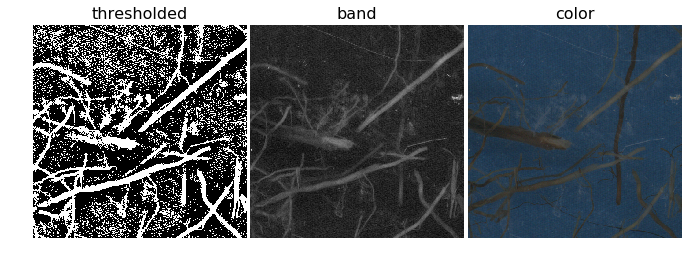

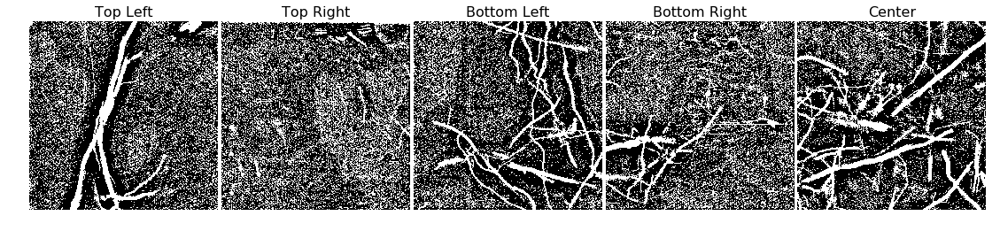

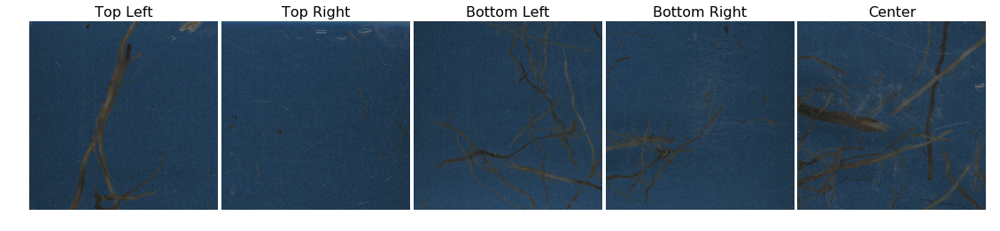

Band 1


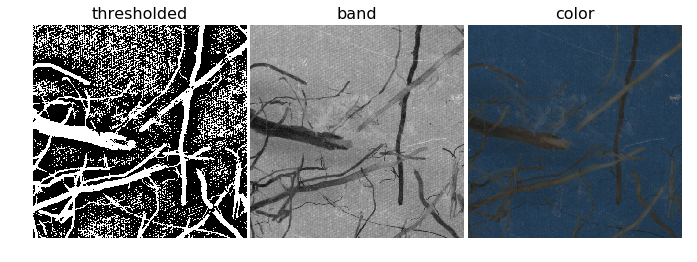

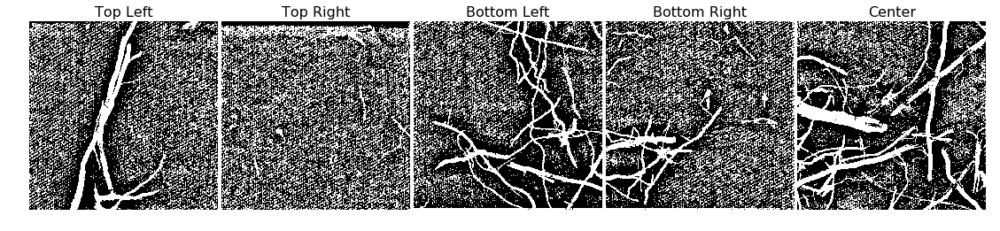

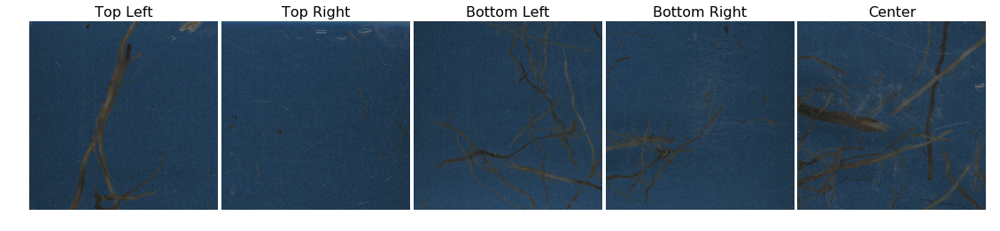

In [15]:
#################################################################################
threshold_args = [
    # Band 1
    {'block_size' : 151,
     'offset'     : -3,
     'param'      : ((151-1)/6)}
    ,
    # Band 2: Comment out
    {'block_size' : 151,
     'offset'     : 3,
     'param'      : ((151-1)/6)}
                   ]
# threshold_args = 'skip'
#################################################################################
if analyze is True:
    threshold = [adapt_equal[i] > filters.threshold_local(adapt_equal[i], **threshold_args[i]) for i in range(len(threshold_args))]

    for i in range(nbands):
        if len(colors) == 3:
            if colors['dark_on_light'][i] is True:
                threshold[i] = ~threshold[i]
        else:
            if colors == 'dark':
                threshold[i] = ~threshold[i]

if plot_control is True:
    for i in range(len(threshold_args)):
        print("Band {}".format(i))
        img = threshold[i]
        zoom = zoom_list[4]
        pr.multi_image_plot([pr._zoom(img, **zoom), pr._zoom(band[i], **zoom),  pr._zoom(image, **zoom)], ["thresholded", 'band', 'color'])
        pr.multi_image_plot([pr._zoom(img, **i) for i in zoom_list], zoom_names)
        img = image
        pr.multi_image_plot([pr._zoom(img, **i) for i in zoom_list], zoom_names)

## Combine the bands
We want objects that were thresholded as white in both bands.

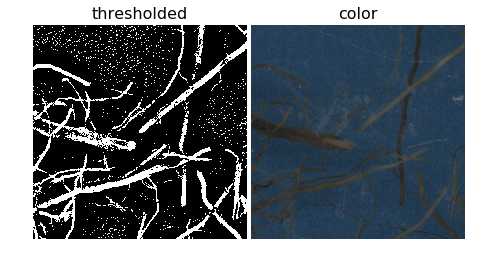

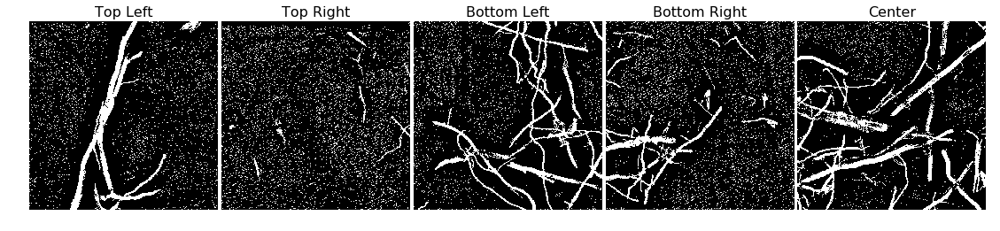

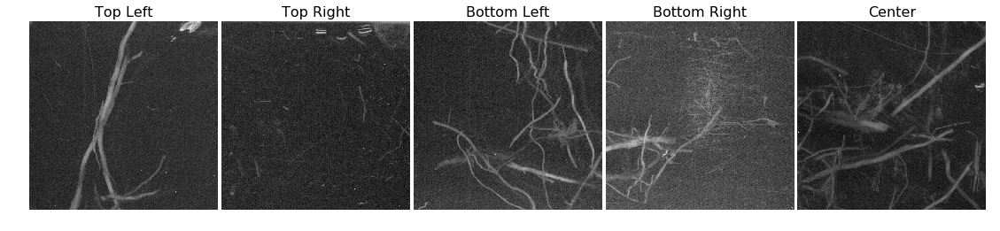

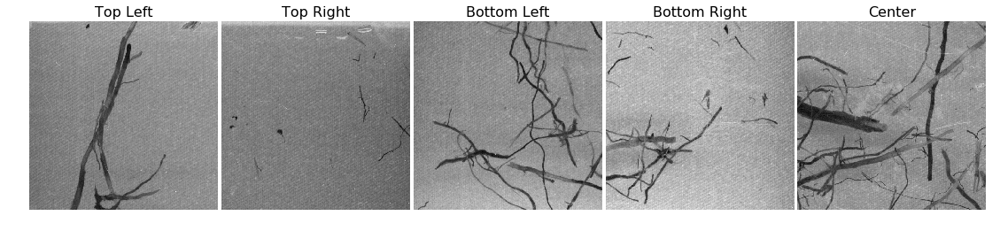

In [16]:
########################################################################
# Nothing to change if objects to keep are white in all images
########################################################################
if analyze is True:
    combined = threshold[0].copy()

    for i in range(1, nbands):
        combined = combined * threshold[i]
    

if plot_control is True:
    img = combined
    pr.multi_image_plot([pr._zoom(img, **zoom), pr._zoom(image, **zoom)], ["thresholded", 'color'])
    pr.multi_image_plot([pr._zoom(img, **i) for i in zoom_list], zoom_names)

    for j in range(nbands):
        img = band[j]
        pr.multi_image_plot([pr._zoom(img, **i) for i in zoom_list], zoom_names)

# Crop and Filter
## Apply a mask
Select the parts of an image you want to anlayze - if this location is consistent across all images. Otherwise, manually crop the image before loading it into pyroots.

Parameters:
`percentage_x`, `y`: percentage of x dimension and y dimension you want to *keep*
`offset_x`, `y`: For placing the center of the kept area. Values of 0 center the mask over the image. Offsets idenify percentages of the x and y dim to move the center.
`rotation`: For ellipses only (`rectangle=False`. Degrees?
`rectangle`: Should the mask be a rectangle? If `True`, then gives an ellipse. 

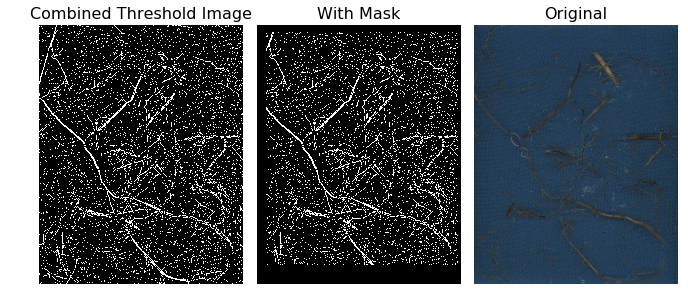

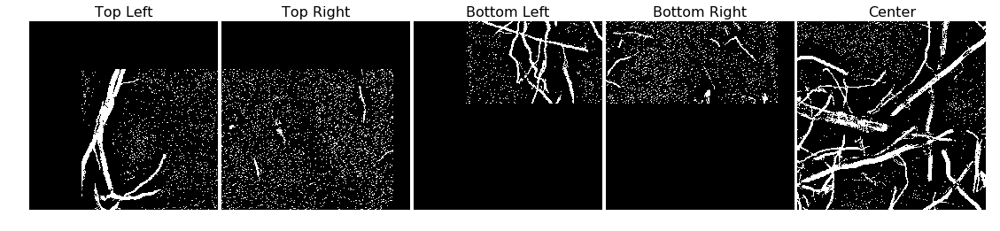

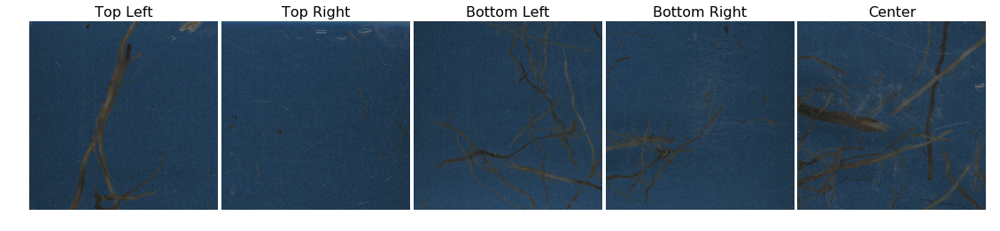

In [17]:
############################################################################
mask_args = {'percentage_x' : 94,     # percentage of the image width, height you want to keep
             'percentage_y' : 89.5,
             'offset_x'     : 1.5,     # offset center of the mask this percentage of the total width (positive to right)
             'offset_y'     : 2,     # positive is up
             'rotation'     : 0,     # only works with ellipse
             'rectangle'    : True   # do you want to mask as a rectangle? or an ellipse?
            }
# mask_args = 'skip'        # Do you even want a mask?
############################################################################
if analyze is True:
    if mask_args == 'skip':
        mask = combined
    else:
        mask = combined * pr.draw_mask(combined, **mask_args)

if plot_control is True:
    img = mask
    pr.multi_image_plot([combined, mask, image], ["Combined Threshold Image", "With Mask", "Original"])
    pr.multi_image_plot([pr._zoom(img, **i) for i in zoom_list], zoom_names)
    img = image
    pr.multi_image_plot([pr._zoom(img, **i) for i in zoom_list], zoom_names)

## Apply noise filter
This consists of two steps:

1. A series of binary openings and closings, using a structure defined by `radius_1` (in pixels). This removes pixel noise.
2. A series of median filters, using a structure defined by `radius_2` for `median_iterations` replicates. This smooths object edges.

The first step will disconnect loosely connected objects, and also removes very small objects.
The second step is a smoothing step that also removes speckles.

Set radius to 0 to skip either step. Larger radii are more aggressive, as are more median iterations

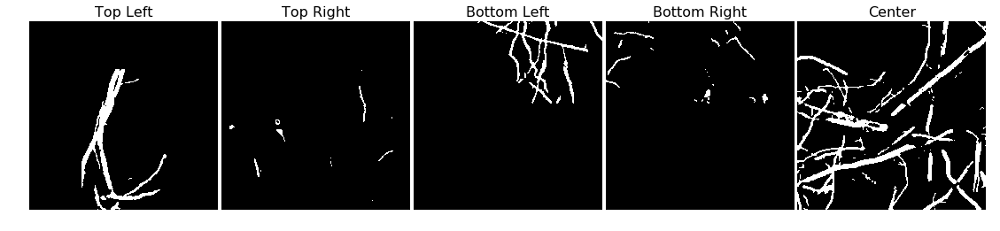

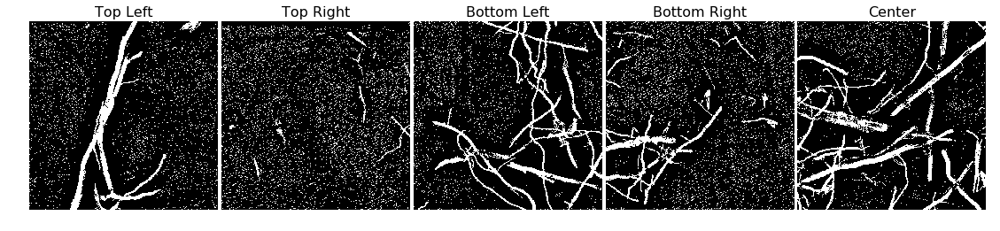

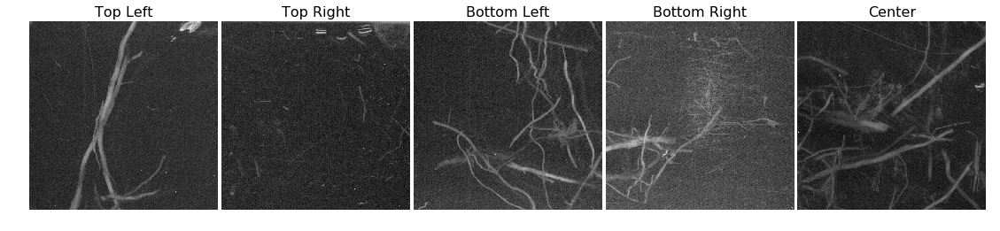

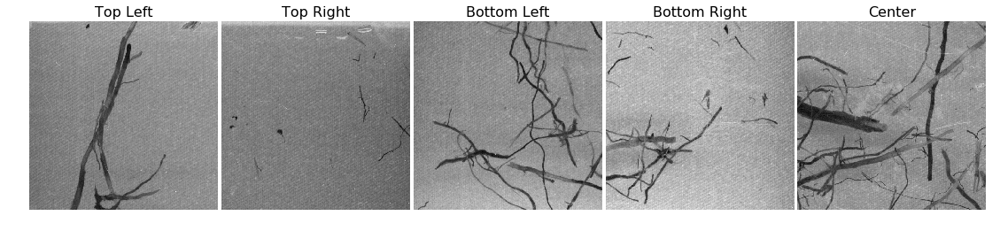

In [18]:
######################################################################
noise_removal_args = {'radius_1' : 0,
                      'radius_2' : 2,
                      'median_iterations' : 3}
# noise_removal_args = 'skip'
######################################################################
if analyze is True:
    no_noise = pr.noise_removal(mask, **noise_removal_args)

if plot_control is True:
    img = no_noise
    pr.multi_image_plot([pr._zoom(img, **i) for i in zoom_list], zoom_names)

    img = combined
    pr.multi_image_plot([pr._zoom(img, **i) for i in zoom_list], zoom_names)

    for j in range(nbands):
        img = band[j]
        pr.multi_image_plot([pr._zoom(img, **i) for i in zoom_list], zoom_names)


## Filter by morphology
Some false positives likely still remain - bits of rock, for example - that have clearly different shapes than roots. We can remove them based on this shape.

Parameters:

- `loose_` and `strict_` `eccentricity`: *Minimum* eccentricity (of an ellipse with equivalent moments) of an object. Larger is more stringent, and favors stringy things.
- `loose_` and `strict_` `solidity`: *Maximum* solidity (area / convex hull area) of an object. Smaller is more stringent, and favors stringy things. 
- `loose_` arguments: An object must pass *both* of these criteria, and so sets a global minimum stringency.
- `strict_` arguments: An object must pass *one* of these criteria, as well as both `loose_`. 
- `min_length`: Minimum length of an object's ellipse with equivalent moments. Larger is more stringent. In pixels.
- `min_size`: Minimum area of an object, in pixels.


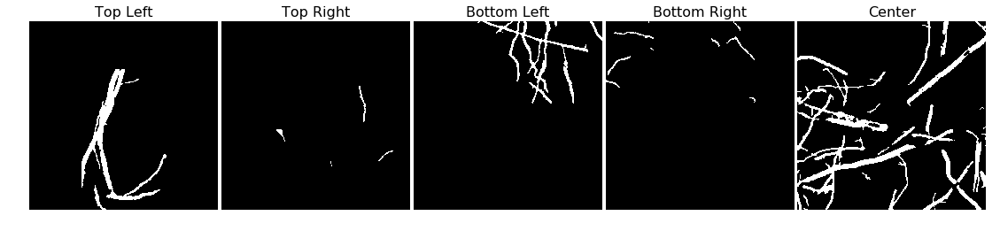

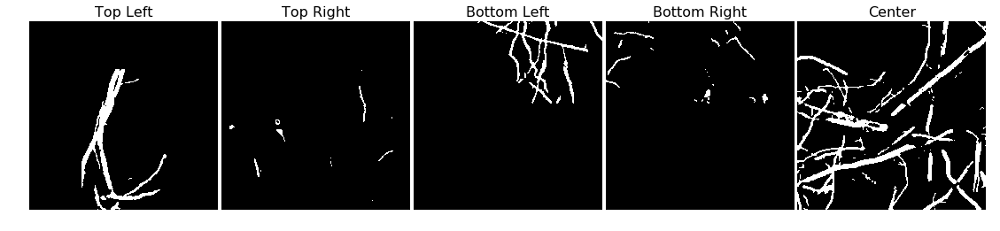

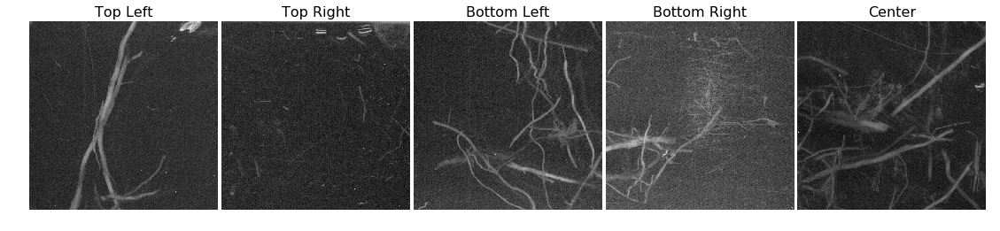

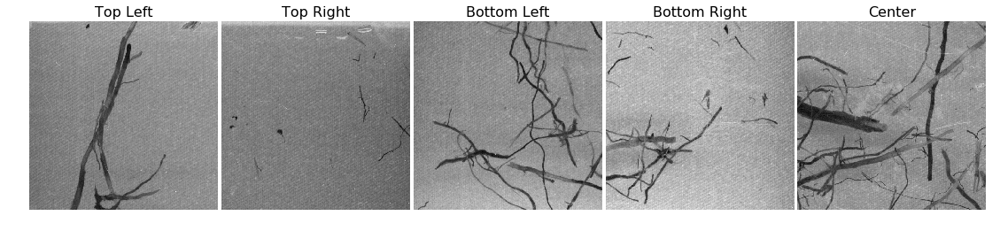

In [19]:
#######################################################################
morphology_filter_args = {'loose_eccentricity'  : .5, 
                          'loose_solidity'      : .8, 
                          'strict_eccentricity' : .95, 
                          'strict_solidity'     : .6, 
                          'min_length'          : 0, 
                          'min_size'            : 0}
# morphology_filter_args = 'skip'
#######################################################################


if analyze is True:
    morph_filt = pr.morphology_filter(no_noise, **morphology_filter_args)

if plot_control is True:
    img = morph_filt
    pr.multi_image_plot([pr._zoom(img, **i) for i in zoom_list], zoom_names)

    img = no_noise
    pr.multi_image_plot([pr._zoom(img, **i) for i in zoom_list], zoom_names)

    for j in range(nbands):
        img = band[j]
        pr.multi_image_plot([pr._zoom(img, **i) for i in zoom_list], zoom_names)

## Fill Gaps and Small Holes - Final Smoothing
Up to now, some objects that should have been connected were not connected. This helped remove noise and dirt, but now we want to regain that connectivity. We'll use a binary closing operation to close small gaps, then fill small holes remaining. Finally, we'll run another median filter for smoothing.

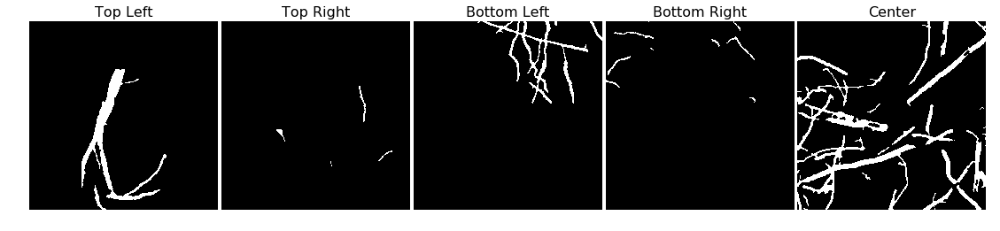

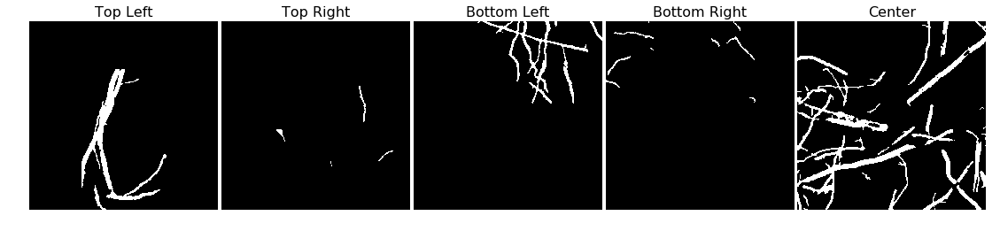

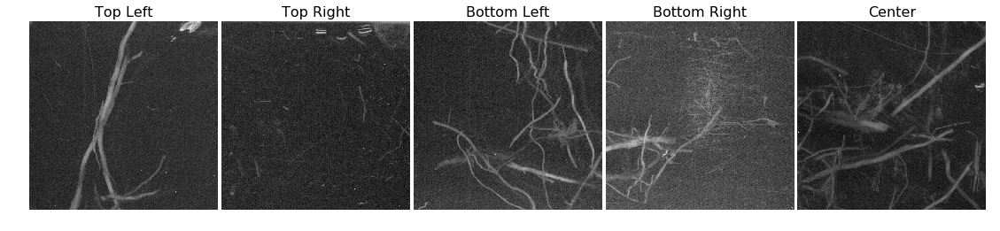

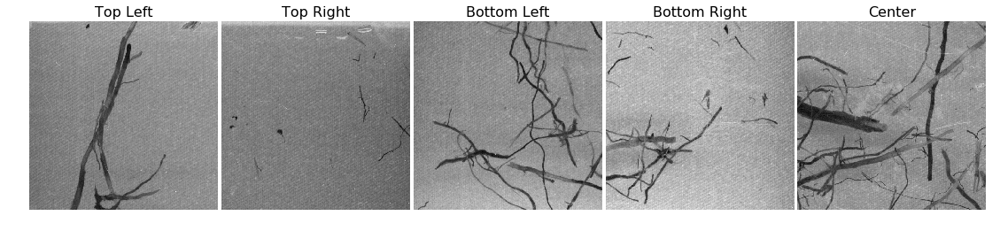

In [21]:
####################################################################################
fill_gaps_args = {'closing_radius' : 3,
                  'min_hole_size'  : 100,
                  'median_radius'  : 1.6}
# fill_gaps_args = 'skip'
####################################################################################

if analyze is True:
    filled_gaps = pr.fill_gaps(morph_filt, **fill_gaps_args)

if plot_control is True:
    img = filled_gaps
    pr.multi_image_plot([pr._zoom(img, **i) for i in zoom_list], zoom_names)

    img = morph_filt
    pr.multi_image_plot([pr._zoom(img, **i) for i in zoom_list], zoom_names)

    for j in range(nbands):
        img = band[j]
        pr.multi_image_plot([pr._zoom(img, **i) for i in zoom_list], zoom_names)

# Skeletonize, measure lengths and diameters, filter again
## Medial Axis Skeletonization
Now we can find the medial axis of each object, compute the diameter of the object at each point along that axis, and compute the length of each pixel on the axis.

No parameters here!

The function returns a dictionary containing:
1. `'objects'` : A binary image of objects
2. `'diameter'` : A 1-band image of medial axes with diameters along the axis
3. `'length'` : A 1-band image of medial axes with pixel lengths along the axis
4. `'geometry'` : A data table containing object lengths and mean diameters

The plotting doesn't show the medial axes terribly well at images >500x500 pixels

Total Number of Objects: 436


/home/patrick/.local/lib/python3.5/site-packages/matplotlib/cbook.py:136: MatplotlibDeprecationWarning: The spectral and spectral_r colormap was deprecated in version 2.0. Use nipy_spectral and nipy_spectral_r instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


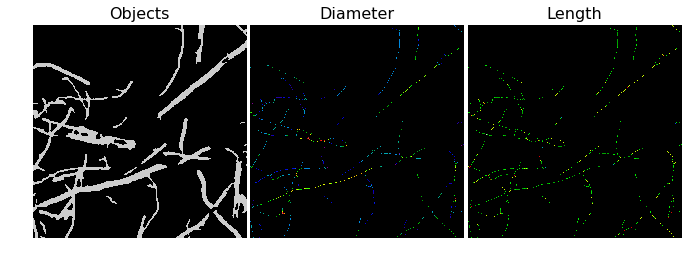

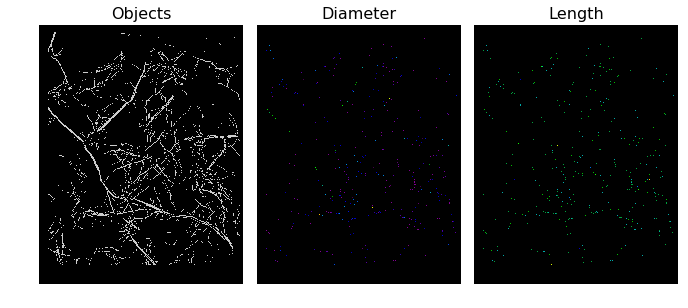

In [22]:
####################################################################################
# Don't need to change anything here.
####################################################################################

if analyze is True:
    skel_dict = pr.skeleton_with_distance(filled_gaps)  # this function returns a dictionary of objects, similar to a named list in R

    dictionary = skel_dict
    print("Total Number of Objects: " + str(len(dictionary["geometry"])))

if plot_control is True:
    img_list = [dictionary["objects"], dictionary["diameter"], dictionary["length"]]
    pr.multi_image_plot([pr._zoom(i, **zoom) for i in img_list], ["Objects", "Diameter", "Length"], color_map = "spectral")
    pr.multi_image_plot(img_list, ["Objects", "Diameter", "Length"], color_map = "spectral")

## Length-width filter
Besides the dictionary returned from skeletonization, the length:width filter requires a single parameter, `threshold`, that is the minimum length:width ratio for objects. It removes all objects that don't meet this threshold, and then updates the geometry dataframe and images.

Note: This function gives a warning that you can ignore.

/home/patrick/.local/lib/python3.5/site-packages/pyroots/geometry_filters.py:256: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  geom_out.loc[0] = np.array([0,0])  # re-insert empty space index.


Total Number of Objects: 422


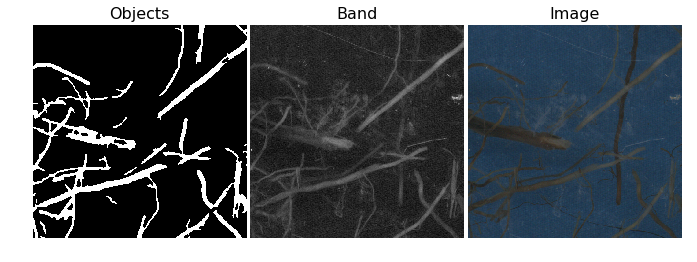

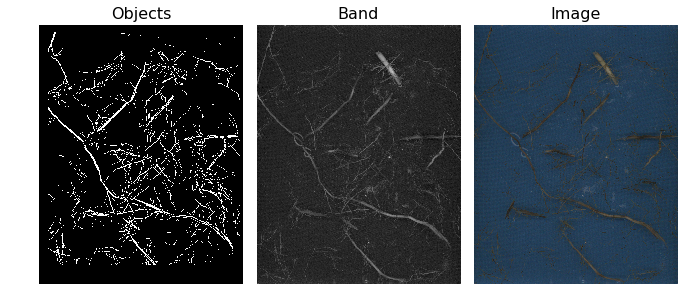

Total Number of Objects: 436


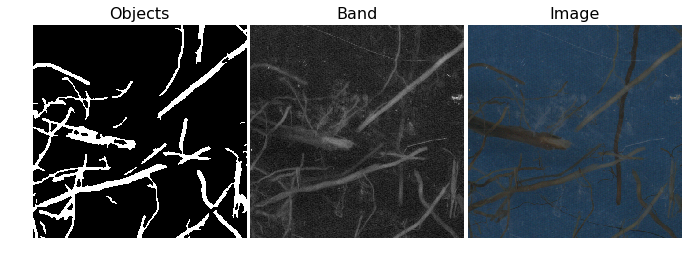

In [25]:
#################################################################################
lw_filter_args = {"threshold" : 5}  # strictly speaking doesn't need to be a dict, but good for clarity.
# lw_filter_args = 'skip'
#################################################################################

if analyze is True:
    lw_dict = pr.length_width_filter(skel_dict, **lw_filter_args)

    dictionary = lw_dict
    print("Total Number of Objects: " + str(len(dictionary["geometry"])))

if plot_control is True:
    img_list = [dictionary["objects"], band[0], image]
    pr.multi_image_plot([pr._zoom(i, **zoom) for i in img_list], 
                        ["Objects", "Band", "Image"], color_map = "gray")
    pr.multi_image_plot(img_list, ["Objects", "Band", "Image"], color_map = "gray")

    dictionary = skel_dict
    print("Total Number of Objects: " + str(len(dictionary["geometry"])))

    img_list = [dictionary["objects"], band[0], image]
    pr.multi_image_plot([pr._zoom(i, **zoom) for i in img_list], 
                        ["Objects", "Band", "Image"], color_map = "gray")

## Filter by Mean Diameter

Remove objects that are narrower than a given threshold (on average), or wider than a given threshold (on average). Uses `pyroots.diameter_filter`. This filters objects by setting a threshold for diameter at a percentile. For example, if the `max_diameter` is 10, and `max_percentile` is 50, then objects where more than 50% of the length is wider than 10 pixels will be removed.

The thinking is that objects that are mostly too wide, or mostly too narrow, are probably not ones you want to keep, even though some parts of the objects might be narrow enough to look 'real'. However, watch out for true objects that are connected to false objects. 

Setting the percentiles to 100 and pixel_level to true allows you to remove just regions that are wider/narrower than desired. A safer route is to set diameter bins at your cutoffs in the next step, so you don't lose data.

Arguments:
- `max_`, `min_diameter`: Set thresholds 
- `max_`, `min_percentile`: maximum percentage of length along which an object crosses thresholds
- `pixel_level`: Do you want to ignore *sections* of objects that are not within max/min diameter thresholds?

/home/patrick/.local/lib/python3.5/site-packages/scipy/ndimage/measurements.py:639: RuntimeWarning: invalid value encountered in true_divide
  return sum / numpy.asanyarray(count).astype(numpy.float)


Total Number of Objects: 237
   Diameter   Length
1  6.090059   45.677
5  4.090407   51.943
6  4.213409   31.321
7  6.492096  137.814


/home/patrick/.local/lib/python3.5/site-packages/matplotlib/cbook.py:136: MatplotlibDeprecationWarning: The spectral and spectral_r colormap was deprecated in version 2.0. Use nipy_spectral and nipy_spectral_r instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


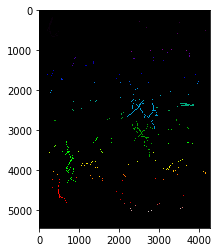

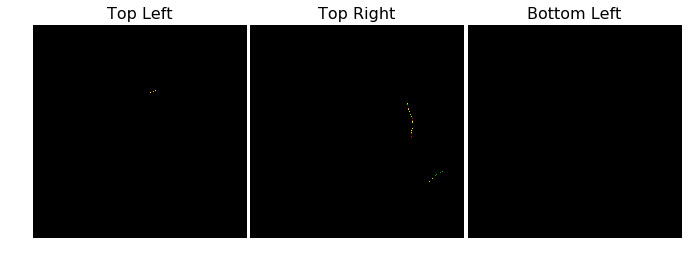

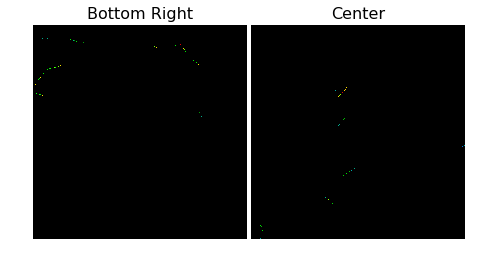

In [26]:
################################################################
diam_filter_args = {'max_diameter'   : 12,
                 'min_diameter'   : 4.5,
                 'max_percentile' : 100,      # xx percent must not be larger than max_diameter
                 'min_percentile' : 100,      # xx percent must not be smaller than min_diameter
                 'pixel_level'    : False}    # remove individual pixels that don't meet max/min requirements?
# diam_filter_args = 'skip'
################################################################

if analyze is True:
    if diam_filter_args is 'skip':
        diam_dict = lw_dict
    else:
        diam_dict = pr.diameter_filter(lw_dict, **diam_filter_args)

    dictionary = diam_dict
    print("Total Number of Objects: " + str(len(dictionary["geometry"])))
    print(dictionary['geometry'][1:5])

if plot_control is True:
    img = ndimage.label(dictionary['objects'])[0]
    plt.imshow(img, cmap="spectral")
    img = dictionary['diameter']
    pr.multi_image_plot([pr._zoom(img, **i) for i in zoom_list[0:3]], zoom_names[0:3], color_map = "spectral")
    pr.multi_image_plot([pr._zoom(img, **i) for i in zoom_list[3:5]], zoom_names[3:5], color_map = "spectral")

## Summarize
Now summarize your data into a table

You can calculate lengths by diameter class if desired. Give a list of maximums for each diameter class. `pyroots` will automatically add a class if objects are wider than the largest class provided. Use caution if binning by diameter with Frangi-based segmentation. Frangi diameters will be a result of both the true diameter of the object as well as it's contrast with the background (transparency).

Also, name your image for identifying later in the table.

In [27]:
################################################################
diameter_bins = [3, 5, 10, 20]
# diameter_bins = None
image_name = "test_image"
################################################################

if analyze is True:
    if diameter_bins is 'skip':
        summary_df = pr.summarize_geometry(diam_dict['geometry'], image_name)

    else:
        diam_out, summary_df = pr.bin_by_diameter(diam_dict['length'],
                                                  diam_dict['diameter'],
                                                  diameter_bins,
                                                  image_name)
    print("Maximum diameter: {}\n\nSummary Dataframe:\n".format(np.max(diam_dict['diameter'])))
    print(summary_df)
    # print(diam_dict['geometry'])

Maximum diameter: 11.661903789690601

Summary Dataframe:

    ImageName  DiameterClass     Length
0  test_image              3    783.965
1  test_image              5   6068.290
2  test_image             10  12092.963
3  test_image             20    901.618


## Save parameters

In [31]:
###############################################################
settings_path = dir_in
settings_name = 'root_color_parameters_example.py'  # arbitrary extension for clarity
write = True                               # automatically update items as changed? 
# write = False
################################################################

dicts = [
    'colors',#
    'contrast_kernel_size',#
    'threshold_args',#
    'mask_args',
    'noise_removal_args',
    'morphology_filter_args',
    'fill_gaps_args',
    'lw_filter_args',
    'diam_filter_args',
    'diameter_bins'
]

if write is True:
    path_out = os.path.join(settings_path, settings_name)
    print("Wrote to: {}\n".format(path_out))
    with open(path_out, 'w') as file:
        for i in dicts:
            if str(locals()[i]) is locals()[i]:
                print(i + " = '" + str(locals()[i]) + "'", file=file)
            else:
                print(i + " = " + str(locals()[i]), file=file)

    for i in dicts:
        if str(locals()[i]) is locals()[i]:
            print(i + " = '" + str(locals()[i]) + "'")
        else:
            print(i + " = " + str(locals()[i]))

Wrote to: /home/patrick/Cloud/Codes/pyroots/Example Images/Roots - Color/root_color_parameters_example.py

colors = {'band': [0, 2], 'dark_on_light': [False, True], 'colorspace': 'rgb'}
contrast_kernel_size = 500
threshold_args = [{'offset': -3, 'block_size': 151, 'param': 25.0}, {'offset': 3, 'block_size': 151, 'param': 25.0}]
mask_args = {'rotation': 0, 'percentage_y': 89.5, 'offset_x': 1.5, 'percentage_x': 94, 'rectangle': True, 'offset_y': 2}
noise_removal_args = {'radius_2': 2, 'median_iterations': 3, 'radius_1': 0}
morphology_filter_args = {'loose_eccentricity': 0.5, 'strict_solidity': 0.6, 'min_size': 0, 'loose_solidity': 0.8, 'strict_eccentricity': 0.95, 'min_length': 0}
fill_gaps_args = {'median_radius': 1.6, 'min_hole_size': 100, 'closing_radius': 3}
lw_filter_args = {'threshold': 5}
diam_filter_args = {'max_diameter': 12, 'pixel_level': False, 'max_percentile': 100, 'min_diameter': 4.5, 'min_percentile': 100}
diameter_bins = [3, 5, 10, 20]


# Test
## Test the parameters using the thresholding_segmentation() function
Restart the python kernel before testing. This clears the workspace and reloads pyroots, so you can adequately test whether the parameters script made in the previous step work and behaves as you expect it to.

In [9]:
###############################################################
path_to_settings = "/home/patrick/Cloud/Codes/pyroots/Example Images/Roots - Color/root_color_parameters_example.py"

dir_in = "/home/patrick/Cloud/Codes/pyroots/Example Images/Roots - Color"
file_in = ["Root_Color_1.TIF", "Root_Color_2.TIF", "Root_Color_1.TIF"]

# what image do you want to test? Select the image index from the file_in list.
selection = 0
################################################################
import pyroots as pr
import os
from skimage import io

exec(open(path_to_settings).read(), globals())

image = io.imread(os.path.join(dir_in, file_in[selection]))



# image = io.imread(path_to_image)

t = pr.thresholding_segmentation(image, 
                              threshold_args,
                              'default', 
                              colors, 
                              contrast_kernel_size,
                              mask_args,
                              noise_removal_args,
                              morphology_filter_args,
                              fill_gaps_args,
                              lw_filter_args,
                              diam_filter_args,
                              diameter_bins,
                              verbose=True
                              )

Analysis bands selected


/home/patrick/Programs/scikit-image/skimage/util/dtype.py:122: UserWarning: Possible precision loss when converting from float64 to uint8
  .format(dtypeobj_in, dtypeobj_out))


Contrast enhanced
Thresholding complete
Image masked
Smoothing and noise removal complete
Morphology filtering complete
Smoothing and gap filling complete
Skeletonization complete


/home/patrick/.local/lib/python3.5/site-packages/pyroots/geometry_filters.py:256: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  geom_out.loc[0] = np.array([0,0])  # re-insert empty space index.


Length:width filtering complete


/home/patrick/.local/lib/python3.5/site-packages/scipy/ndimage/measurements.py:639: RuntimeWarning: invalid value encountered in true_divide
  return sum / numpy.asanyarray(count).astype(numpy.float)


Diameter filter complete
Done


## Inspect Results

  ImageName  DiameterClass     Length
0   default              3   2607.748
1   default              5  17261.516
2   default             10  66528.100
3   default             20  55676.462
4   default             68  12957.077


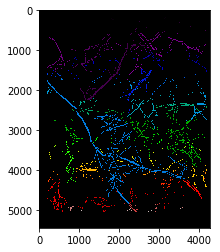

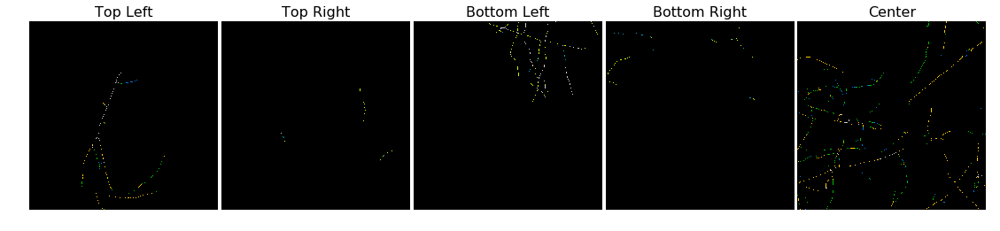

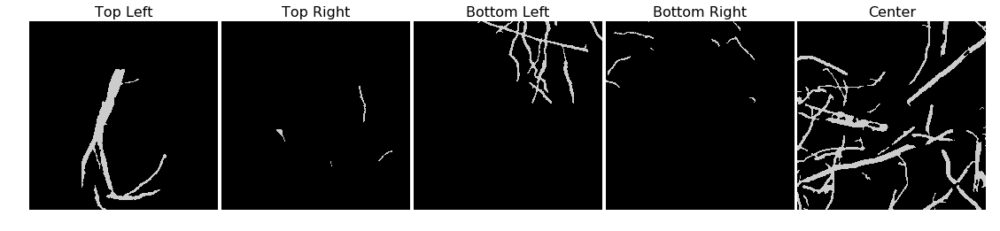

In [10]:
print(t['geometry'])

dictionary = t

img = ndimage.label(dictionary['objects'])[0]
plt.imshow(img, cmap="nipy_spectral")
img = dictionary['diameter']
pr.multi_image_plot([pr._zoom(img, **i) for i in zoom_list], zoom_names, color_map = "nipy_spectral")
img = dictionary['objects']
pr.multi_image_plot([pr._zoom(img, **i) for i in zoom_list], zoom_names, color_map = "nipy_spectral")

## Run loop test
Note that if your images are large (say, 30+ MB .tif images), then running this on multiple cores (`threads`>1) requires a good amount of memory (~ 2.5 gb/image) for some steps. This can easily overload personal computers. Small images (< 10 MB) are no problem.

ERROR:root:Line magic function `%T` not found.


In [8]:
import os
import pyroots as pr
import warnings

#################################################################################################
t_dir_in = dir_in
ext_in = ".TIF"
method = "thresholding"
dir_out = os.path.join(t_dir_in, 'test_out')
table_out = None
params = path_to_settings
#################################################################################################

warnings.filterwarnings("ignore")

pr.pyroots_batch_loop(dir_in=t_dir_in,
                   extension_in=ext_in,
                   method=method,
                   dir_out=dir_out,
                   table_out=table_out,
                   table_overwrite=False, # False --> appends, True --> overwrites
                   params=params,
                   save_images=True,
                   threads=3  # one for each image
                  )

The parameters you've loaded are:

colors = {'colorspace': 'rgb', 'band': [0, 2], 'dark_on_light': [False, True]}


contrast_kernel_size = 500


threshold_args = [{'block_size': 151, 'param': 25.0, 'offset': -3}, {'block_size': 151, 'param': 25.0, 'offset': 3}]


mask_args = {'offset_y': 2, 'offset_x': 1.5, 'rectangle': True, 'percentage_x': 94, 'percentage_y': 89.5, 'rotation': 0}


noise_removal_args = {'radius_2': 2, 'radius_1': 0, 'median_iterations': 3}


morphology_filter_args = {'min_size': 0, 'strict_solidity': 0.6, 'loose_eccentricity': 0.5, 'loose_solidity': 0.8, 'min_length': 0, 'strict_eccentricity': 0.95}


fill_gaps_args = {'median_radius': 1.6, 'min_hole_size': 100, 'closing_radius': 3}


lw_filter_args = {'threshold': 5}


diam_filter_args = {'pixel_level': False, 'max_percentile': 100, 'min_percentile': 100, 'min_diameter': 4.5, 'max_diameter': 12}


diameter_bins = [3, 5, 10, 20]


Saving data table to: /home/patrick/Cloud/Codes/pyroots/Example Images/Roots - Color/Py

  0%|          | 0/3 [00:00<?, ?it/s]

Done: Root_Color_2.TIF


100%|██████████| 3/3 [01:57<00:00, 39.14s/it]

Done: Root_Color_1.TIF


4it [02:10, 31.31s/it]                       

Done: Root_Color_3.TIF


5it [02:48, 33.19s/it]


,Time,ImageName,DiameterClass,Length
0,2017-06-06 18:06:26,Root_Color_2.TIF,3,733.000
1,2017-06-06 18:06:26,Root_Color_2.TIF,5,4921.214
2,2017-06-06 18:06:26,Root_Color_2.TIF,10,18603.533
3,2017-06-06 18:06:26,Root_Color_2.TIF,20,22566.878
4,2017-06-06 18:06:26,Root_Color_2.TIF,43,3435.680
0,2017-06-06 18:06:40,Root_Color_1.TIF,3,2607.748
1,2017-06-06 18:06:40,Root_Color_1.TIF,5,17261.516
2,2017-06-06 18:06:40,Root_Color_1.TIF,10,66528.100
3,2017-06-06 18:06:40,Root_Color_1.TIF,20,55676.462
4,2017-06-06 18:06:40,Root_Color_1.TIF,68,12957.077
